In [1]:
import pandas as pd
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from torchvision import models
import torch.optim as optim
from sklearn.metrics import cohen_kappa_score
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset

/opt/sw/spack/apps/linux-rhel8-x86_64_v2/gcc-10.3.0/python-3.9.9-jh/lib/python3.9/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
MEAN = [0.41661593, 0.29097975, 0.20843531]
STD = [0.26398131, 0.19219237, 0.15810781]

# Custom class for dataset loading

In [3]:
class CustomImageDataset(Dataset):
    def __init__(self, file_paths, labels=None, transform=None):
        self.file_paths = file_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        img_path = self.file_paths[idx]
        image = Image.open(img_path+'.jpeg').convert("RGB")
        if self.transform:
            image = self.transform(image)

        if self.labels is not None:  # For training and validation
            label = self.labels[idx]
            return image, label
        else:  # For testing
            return image


In [4]:
train_transform = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),                    # Random horizontal flip
            transforms.ColorJitter(brightness=0.2, contrast=0.2),      # Random brightness/contrast
            transforms.ToTensor(),                                    # Convert to Tensor
            transforms.Normalize(mean=MEAN,          # Normalize to ImageNet stats
                                 std=STD),
        ])

val_test_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=MEAN,
                                 std=STD),
        ])

In [5]:
# Load CSV
csv_path = "trainLabels.csv"
data = pd.read_csv(csv_path)

# Add full paths to image files
train_folder = "train_crop_224/"
data['image_path'] = data['image'].apply(lambda x: os.path.join(train_folder, x))

# Stratified split for training and validation
train_paths, val_paths, train_labels, val_labels = train_test_split(
    data['image_path'].values,
    data['level'].values,
    test_size=0.2,  # 20% for validation
    stratify=data['level'].values,
    random_state=42
)


# Loading the dataset

In [6]:
# Training and Validation datasets
train_dataset = CustomImageDataset(train_paths, train_labels, transform=train_transform)
val_dataset = CustomImageDataset(val_paths, val_labels, transform=val_test_transform)

# Test dataset
# test_folder = "path/to/test/folder"
# test_paths = [os.path.join(test_folder, fname) for fname in os.listdir(test_folder)]
# test_dataset = CustomImageDataset(test_paths, transform=val_test_transform)

# Data loaders
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


# Visualizing dataset

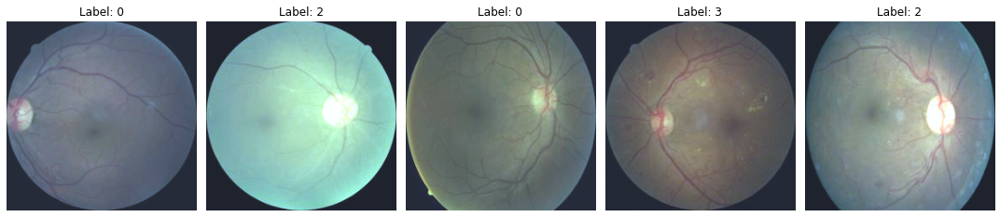

In [106]:
def visualize_augmented_data(dataset, num_samples=5):
    """
    Visualize a few samples from the dataset after applying transformations.
    """
    fig, axes = plt.subplots(1, num_samples, figsize=(15, 5))
    for i in range(num_samples):
        image, label = dataset[i]
        image = image.permute(1, 2, 0).numpy()  # Convert [C, H, W] to [H, W, C]
        image = (image * 0.229) + 0.485         # Denormalize using ImageNet mean and std
        image = np.clip(image, 0, 1)            # Clip values for display

        axes[i].imshow(image)
        axes[i].set_title(f"Label: {label}")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

# Visualize samples from the train dataset
visualize_augmented_data(train_dataset)

# Model building

In [15]:
def train_model_with_validation(model, train_loader, val_loader, num_epochs=10):
    model.train()
    training_loss, validation_loss = [], []
    training_acc, validation_acc = [], []
    kappa_score = []
    for epoch in range(num_epochs):
        # Training phase
        running_loss = 0.0
        correct = 0
        total = 0
        for images, labels in tqdm(train_loader):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_accuracy = 100 * correct / total
        train_loss = running_loss / len(train_loader)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        y_true = []
        y_pred = []

        with torch.no_grad():
            for images, labels in tqdm(val_loader):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

                # Collect predictions and true labels for Kappa calculation
                y_true.extend(labels.cpu().numpy())
                y_pred.extend(predicted.cpu().numpy())

        val_accuracy = 100 * val_correct / val_total
        val_loss /= len(val_loader)

        # Quadratic Weighted Kappa Score
        kappa = cohen_kappa_score(y_true, y_pred, weights="quadratic")
        training_loss.append(train_loss)
        validation_loss.append(val_loss)
        training_acc.append(train_accuracy)
        validation_acc.append(val_accuracy)
        kappa_score.append(kappa)

        # Print epoch metrics
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%")
        print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%, Kappa Score: {kappa:.4f}\n")

        model.train()  # Switch back to training mode
        
    return training_loss, validation_loss, training_acc, validation_acc, kappa_score


In [18]:
model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

# Modify the final layer for 5 classes
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 5)

criterion = nn.CrossEntropyLoss()  # You can pass class weights here if needed
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

In [19]:
epochs=2
training_loss, validation_loss, training_acc, validation_acc, kappa_score = train_model_with_validation(model, train_loader, val_loader, epochs)
torch.save(model.state_dict(), "model/basic_model.pth")

100%|██████████| 110/110 [00:09<00:00, 11.01it/s]


Epoch [1/2]
Train Loss: 0.8165, Train Accuracy: 73.65%
Val Loss: 0.7503, Val Accuracy: 74.77%, Kappa Score: 0.2722



100%|██████████| 110/110 [00:10<00:00, 10.37it/s]

Epoch [2/2]
Train Loss: 0.7422, Train Accuracy: 75.17%
Val Loss: 0.7123, Val Accuracy: 75.82%, Kappa Score: 0.4622



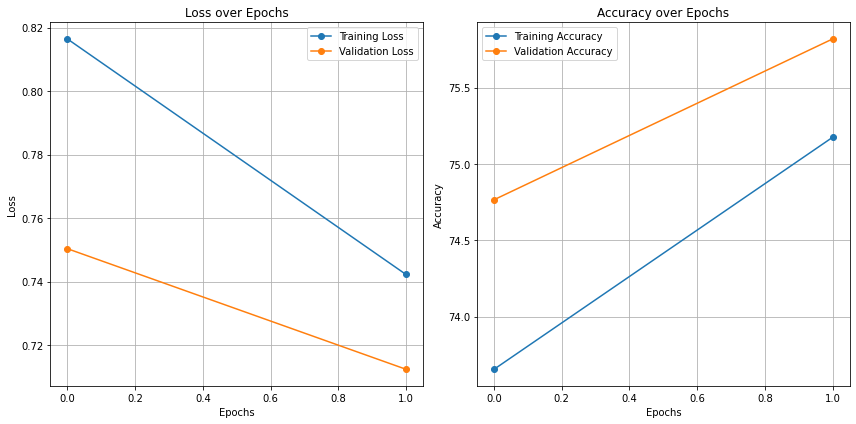

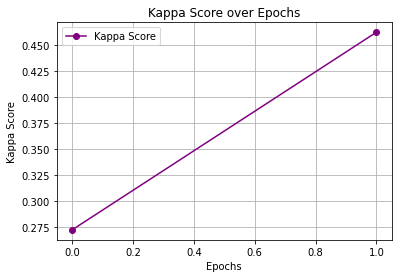

In [21]:
# Plot Loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.plot(training_loss, label='Training Loss', marker='o')
plt.plot(validation_loss, label='Validation Loss', marker='o')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# Plot Accuracy
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.plot(training_acc, label='Training Accuracy', marker='o')
plt.plot(validation_acc, label='Validation Accuracy', marker='o')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()

plt.tight_layout()
plt.savefig('images/basic_test_val.png')

# Plot Kappa Score
plt.figure(figsize=(6, 4))
plt.plot(kappa_score, label='Kappa Score', marker='o', color='purple')
plt.title('Kappa Score over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Kappa Score')
plt.legend()
plt.grid()
plt.savefig('images/basic_kappa.png')



# test file generation

In [7]:
model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 5)
model.load_state_dict(torch.load('model/basic2_model.pth'))
model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# 2. Prepare the test images dataset
test_folder = "test_crop_224/"
test_files = os.listdir(test_folder)
results = []

for f in tqdm(test_files, miniters=1000):
    img = Image.open(os.path.join(test_folder, f)).convert('RGB')
    with torch.no_grad():
        outputs = model(val_test_transform(img).unsqueeze(0).to(device))
        _, pred = torch.max(outputs, 1)  # Get the class index with the highest score
        results.append([os.path.splitext(f)[0], pred.item()])

# 4. Save to CSV
df = pd.DataFrame(results, columns=["image", "level"])
df.to_csv("output/basic2_predictions.csv", index=False)


100%|██████████| 53576/53576 [03:26<00:00, 259.11it/s]


# random dump

In [82]:
import os
import random
from PIL import Image

def load_random_image():
    # Specify the directory containing images
    image_dir = "train_crop_224/"

    # Get a list of all files in the directory
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

    if not image_files:
        print("No images found in the specified directory.")
    else:
        # Pick a random image file
        random_image = random.choice(image_files)
        print(f"Opening image: {random_image}")

        # Open the image using PIL
        image_path = os.path.join(image_dir, random_image)

        return image_path


Opening image: 23141_right.jpeg


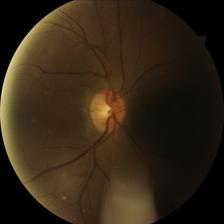

In [90]:
Image.open(load_random_image())

In [68]:
import cv2
import numpy as np
from PIL import Image

def crop_to_eye_region(image_path, output_size=(512, 512)):
    """
    Crop the retina fundus image to focus on the circular eye region and remove black borders.
    
    Args:
        image_path (str): Path to the input image.
        output_size (tuple): The desired output size (height, width) for resizing.
    
    Returns:
        PIL.Image.Image: Cropped and resized image.
    """
    # Load the image
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Threshold to segment the bright retina region
    _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Find the largest contour, assuming it's the retina
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    # Crop the image to the bounding box
    cropped_img = img[y:y+h, x:x+w]
    
    # Resize the cropped image to the desired size
    # resized_img = cv2.resize(cropped_img, output_size, interpolation=cv2.INTER_AREA)
    
    # Convert to PIL Image for further processing
    return Image.fromarray(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))


Opening image: 23540_right.jpeg


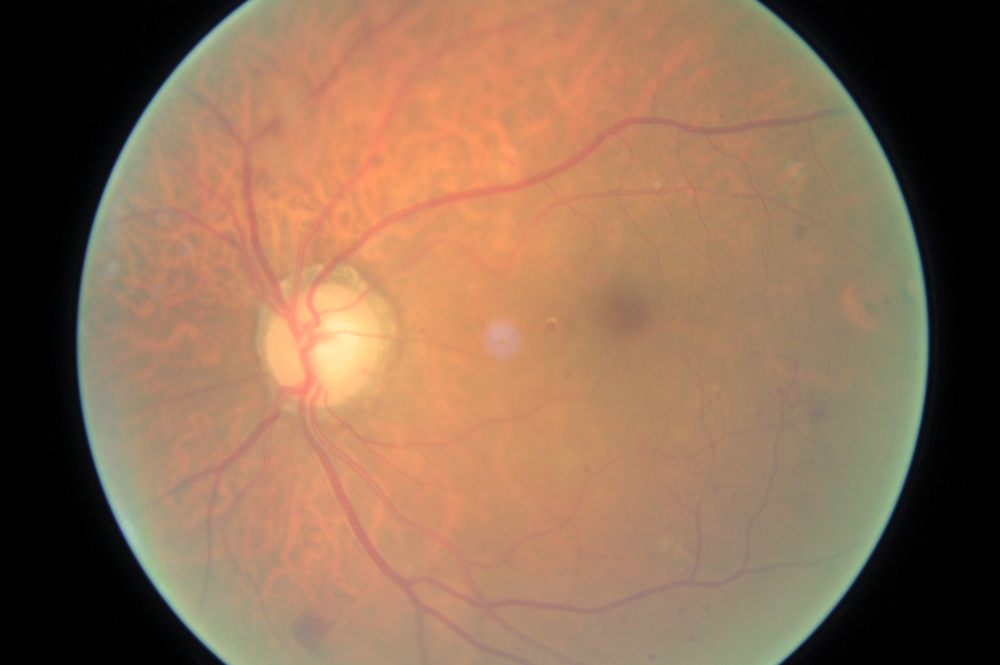

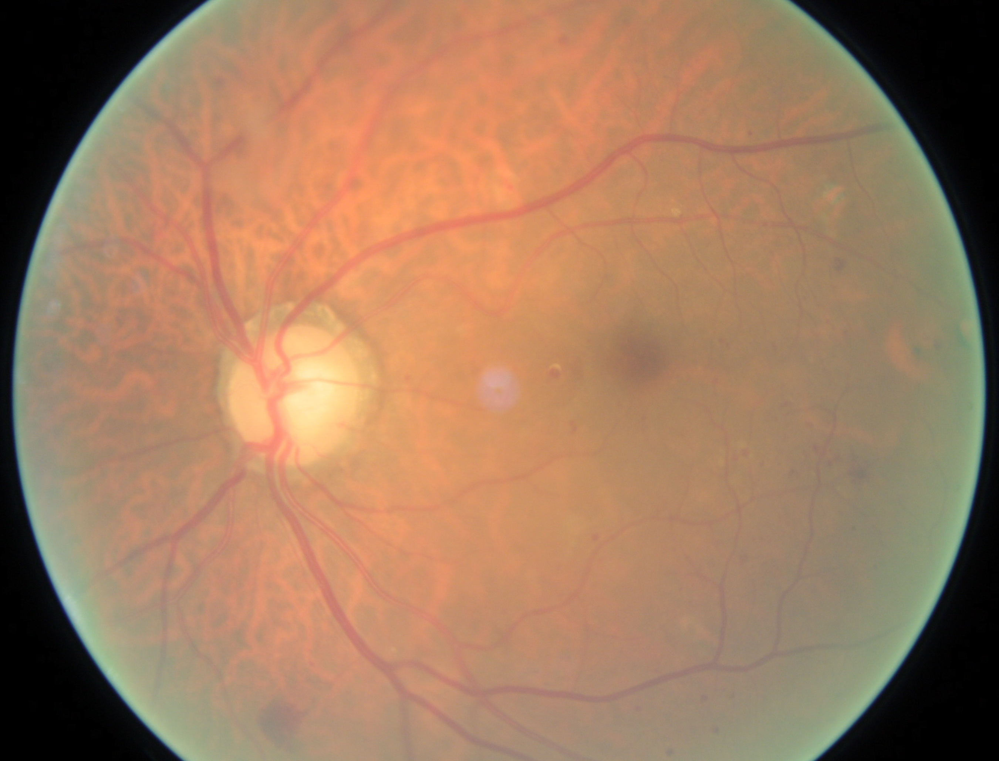

In [81]:
random_image = load_random_image()
Image.open(random_image).show()
# crop_image = crop_to_eye_region(random_image)
# crop_image.show()

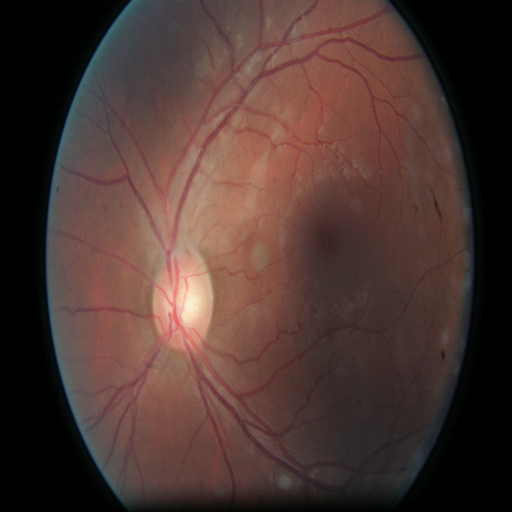

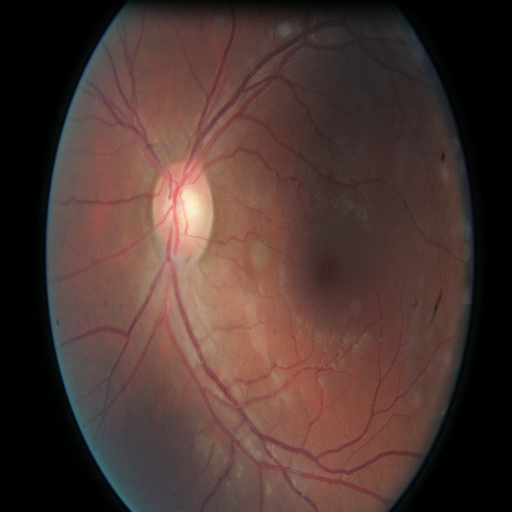

In [24]:
from PIL import ImageOps
img = cv2.imread('train/56_right.jpeg')
img = Image.fromarray(cv2.cvtColor(cv2.resize(img, (512,512), interpolation=cv2.INTER_AREA), cv2.COLOR_BGR2RGB))
img.show()
ImageOps.flip(img)

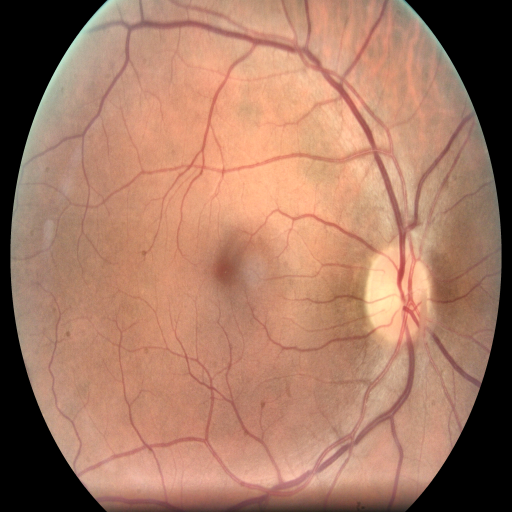

In [8]:
import cv2
def crop_to_eye_region(image_path, output_size=(512, 512)):
    """
    Crop the retina fundus image to focus on the circular eye region and remove black borders.
    
    Args:
        image_path (str): Path to the input image.
        output_size (tuple): The desired output size (height, width) for resizing.
    
    Returns:
        PIL.Image.Image: Cropped and resized image.
    """
    # Load the image
    img = cv2.imread(image_path)
    # img = cv2.cuda_GpuMat().upload(img)
    
    # denoise and CLAHE
    # img = cv2.fastNlMeansDenoisingColored(img, None, 1, 1, 7, 21)
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    clahe = cv2.createCLAHE(clipLimit = 2.0, tileGridSize = (8, 8))
    img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])
    img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Threshold to segment the bright retina region
    _, thresh = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)
    
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    # Find the largest contour, assuming it's the retina
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    # Rescale if w:h ratio is smaller than average (1.31)
    # Round down if needed
    if w/h < 1.31:
        new_h = int(w / 1.31)
        new_y = y + int((h - new_h) / 2)
        y, h = new_y, new_h
        
    # Crop the image to the bounding box
    img = img[y:y+h, x:x+w]

    # Crop the tab
    mask = np.zeros_like(img)
    mask = cv2.circle(mask, (int(w/2), int(h/2)), int(0.48*w), (255,255,255), -1)
    img[mask==0] = 0
    
    
    # Resize the cropped image to the desired size
    resized_img = cv2.resize(img, output_size, interpolation=cv2.INTER_AREA)
    
    # Convert to PIL Image for further processing
    return Image.fromarray(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))

crop_to_eye_region('train/100_left.jpeg')

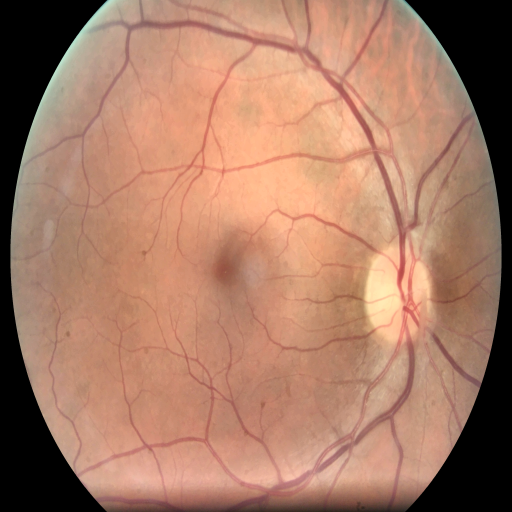

In [13]:
def crop_to_eye_region(image_path, output_size=(512, 512)):
    """
    Crop the retina fundus image to focus on the circular eye region and remove black borders.
    
    Args:
        image_path (str): Path to the input image.
        output_size (tuple): The desired output size (height, width) for resizing.
    
    Returns:
        PIL.Image.Image: Cropped and resized image.
    """
    # Load the image
    img = cv2.imread(image_path)
    # img = cv2.cuda_GpuMat().upload(img)
    
    # denoise and CLAHE
    img = cv2.fastNlMeansDenoisingColored(img, None, 1, 1, 7, 21)
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    clahe = cv2.createCLAHE(clipLimit = 2.0, tileGridSize = (8, 8))
    img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])
    img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Threshold to segment the bright retina region
    _, thresh = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)
    
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    # Find the largest contour, assuming it's the retina
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    # Rescale if w:h ratio is smaller than average (1.31)
    # Round down if needed
    if w/h < 1.31:
        new_h = int(w / 1.31)
        new_y = y + int((h - new_h) / 2)
        y, h = new_y, new_h
        
    # Crop the image to the bounding box
    img = img[y:y+h, x:x+w]

    # Crop the tab
    mask = np.zeros_like(img)
    mask = cv2.circle(mask, (int(w/2), int(h/2)), int(0.48*w), (255,255,255), -1)
    img[mask==0] = 0
    
    
    # Resize the cropped image to the desired size
    resized_img = cv2.resize(img, output_size, interpolation=cv2.INTER_AREA)
    
    # Convert to PIL Image for further processing
    return Image.fromarray(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))

crop_to_eye_region('train/100_left.jpeg')